#Importar librerias

In [ ]:
import glob, os
import yaml
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import shutil

##Conectar a Google Drive para acceder al dataset

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Aumentación

In [ ]:
import albumentations as A

In [ ]:
# Función para visualizar la imagen con las bounding boxes
def visualize(image, bboxes, category_ids, category_id_to_name):
    for bbox, category_id in zip(bboxes, category_ids):
        x_min, y_min, width, height = bbox
        x_max, y_max = x_min + width, y_min + height
        class_name = category_id_to_name[category_id]
        color = (255, 0, 0)
        cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), color, 2)
        cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()


In [ ]:
def get_files_from_folder(folder_path):
    """
    Obtiene una lista de archivos en una carpeta dada.

    :param folder_path: Ruta de la carpeta.
    :return: Lista de nombres de archivos.
    """
    try:
        files = os.listdir(folder_path)
        return [file for file in files if os.path.isfile(os.path.join(folder_path, file))]
    except FileNotFoundError:
        print(f"Error: La carpeta {folder_path} no existe.")
        return []

In [ ]:
# Directorios de las imágenes y etiquetas
images_dir = '/content/drive/MyDrive/dataset/train/images2'
labels_dir = '/content/drive/MyDrive/dataset/train/labels2'

# Mapeo de IDs de categorías a nombres
classes = [
    "1O", "1C", "1E", "1B",
    "2O", "2C", "2E", "2B",
    "3O", "3C", "3E", "3B",
    "4O", "4C", "4E", "4B",
    "5O", "5C", "5E", "5B",
    "6O", "6C", "6E", "6B",
    "7O", "7C", "7E", "7B",
    "8O", "8C", "8E", "8B",
    "9O", "9C", "9E", "9B",
    "10O", "10C", "10E", "10B",
    "11O", "11C", "11E", "11B",
    "12O", "12C", "12E", "12B",
    "J", "SKIP", "SSKIP", "SSSKIP"
]

category_id_to_name = {i: class_name for i, class_name in enumerate(classes)}

# Transformación de Albumentations
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.RGBShift(r_shift_limit=30, g_shift_limit=30, b_shift_limit=30, p=0.3),
    A.OneOf([
        A.MotionBlur(p=0.5),
        A.Sharpen(),
        A.Emboss(),
    ], p=0.5),
], bbox_params=A.BboxParams(format='yolo', label_fields=['category_ids']))

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_01.png
33.0 [0.699197, 0.222656, 0.404341, 0.217634]
23.0 [0.440538, 0.378906, 0.407314, 0.228795]
11.0 [0.710346, 0.452567, 0.346365, 0.25558]
37.0 [0.471012, 0.558594, 0.227442, 0.231027]
14.0 [0.263639, 0.772879, 0.338933, 0.28683]
38.0 [0.53642, 0.819754, 0.289877, 0.293527]
34.0 [0.781701, 0.68192, 0.328527, 0.274554]
27.0 [0.239854, 0.500558, 0.217036, 0.277902]


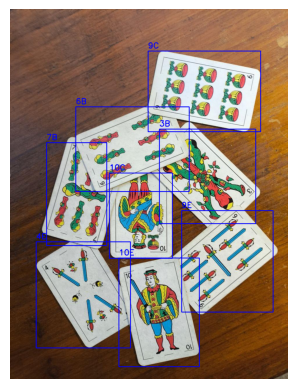

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_41.png
28.0 [0.25472, 0.468192, 0.386502, 0.271205]
11.0 [0.447228, 0.338728, 0.364204, 0.239955]
7.0 [0.626356, 0.532366, 0.356771, 0.174107]
27.0 [0.731901, 0.310268, 0.33596, 0.285714]
25.0 [0.384049, 0.685268, 0.37461, 0.220982]
34.0 [0.618924, 0.773438, 0.228928, 0.261161]


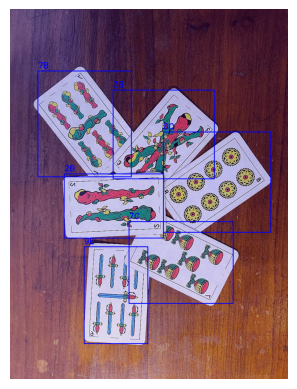

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_40.png
47.0 [0.654172, 0.236533, 0.173703, 0.296677]
3.0 [0.554438, 0.261994, 0.10389, 0.272323]
20.0 [0.566489, 0.317898, 0.181184, 0.224722]
22.0 [0.44764, 0.555904, 0.149601, 0.315496]
24.0 [0.356217, 0.527675, 0.066489, 0.323245]
8.0 [0.297623, 0.570848, 0.143783, 0.332101]
9.0 [0.677443, 0.544834, 0.231882, 0.26236]
46.0 [0.724402, 0.667157, 0.272606, 0.318817]


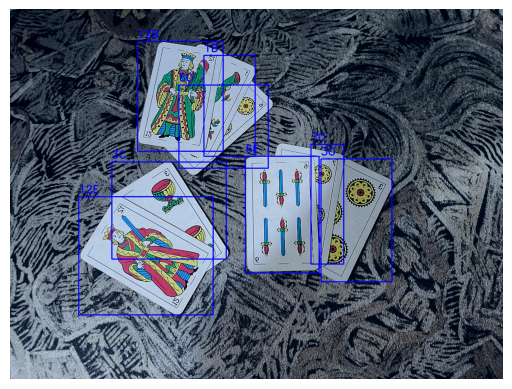

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_42.png
10.0 [0.450201, 0.342634, 0.298796, 0.301339]
29.0 [0.62933, 0.402902, 0.050543, 0.285714]
26.0 [0.760889, 0.488281, 0.209603, 0.297991]
12.0 [0.274788, 0.603795, 0.387989, 0.243304]
45.0 [0.780957, 0.657924, 0.416233, 0.126116]
1.0 [0.653858, 0.800223, 0.221495, 0.203125]
37.0 [0.403374, 0.77567, 0.243794, 0.21875]


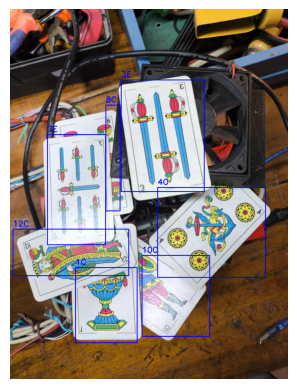

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_21.png
18.0 [0.650884, 0.311942, 0.301769, 0.277902]
16.0 [0.3729, 0.277344, 0.24528, 0.246652]
32.0 [0.24803, 0.362165, 0.307715, 0.226562]
21.0 [0.227219, 0.520089, 0.367177, 0.167411]
13.0 [0.324587, 0.683594, 0.294336, 0.219866]
40.0 [0.459863, 0.739955, 0.196224, 0.223214]
39.0 [0.62041, 0.760045, 0.178386, 0.189732]
44.0 [0.742307, 0.651228, 0.303256, 0.22433]


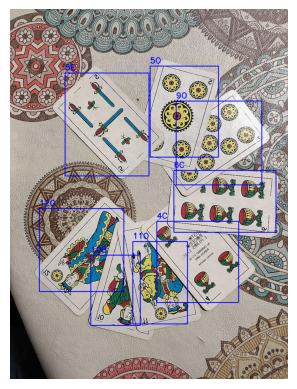

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_28.png
25.0 [0.317985, 0.55535, 0.181184, 0.374167]
34.0 [0.439328, 0.538745, 0.149601, 0.504793]
11.0 [0.60015, 0.518819, 0.308344, 0.551287]


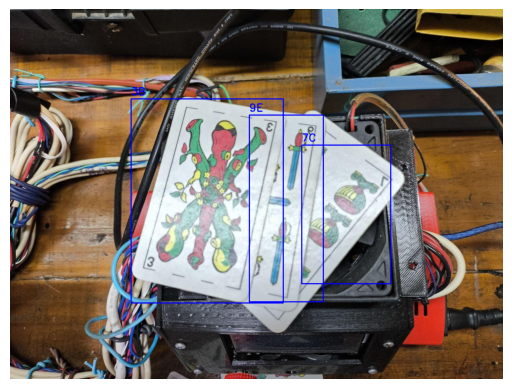

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_29.png
26.0 [0.226475, 0.53404, 0.285417, 0.257813]
30.0 [0.299316, 0.751116, 0.368664, 0.28125]
12.0 [0.363981, 0.404576, 0.304742, 0.242187]
45.0 [0.515609, 0.375, 0.162034, 0.196429]
1.0 [0.669466, 0.388393, 0.157574, 0.274554]
10.0 [0.857514, 0.486049, 0.209603, 0.257812]
14.0 [0.686562, 0.647879, 0.28393, 0.271205]
29.0 [0.502973, 0.681362, 0.225955, 0.25558]


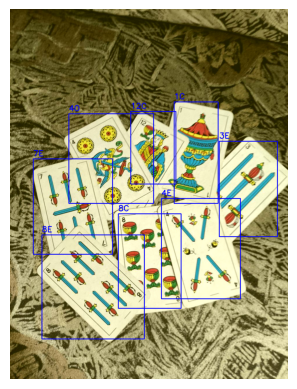

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_30.png
23.0 [0.279338, 0.630626, 0.310007, 0.263467]
31.0 [0.539062, 0.31347, 0.355718, 0.536896]
4.0 [0.624668, 0.547601, 0.139628, 0.332101]
38.0 [0.546958, 0.699261, 0.233544, 0.305533]
33.0 [0.782995, 0.595756, 0.201961, 0.397414]


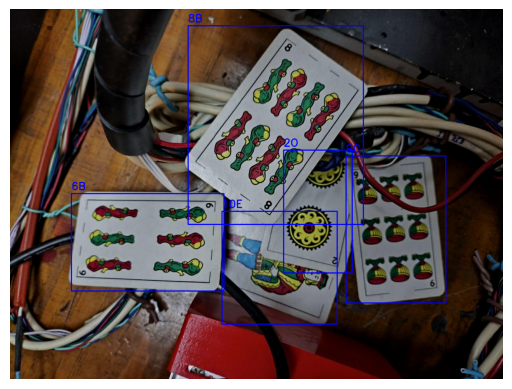

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_31.png
38.0 [0.142204, 0.470111, 0.205286, 0.504793]
4.0 [0.258145, 0.419189, 0.172872, 0.440587]
33.0 [0.389877, 0.502768, 0.19365, 0.490402]
40.0 [0.582696, 0.564206, 0.288398, 0.327673]
15.0 [0.740193, 0.527675, 0.329122, 0.243541]
17.0 [0.733544, 0.301293, 0.315824, 0.291142]


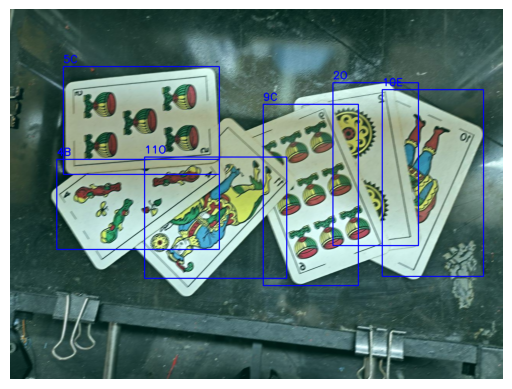

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_32.png
36.0 [0.394033, 0.214947, 0.221908, 0.35092]
32.0 [0.699053, 0.228231, 0.22357, 0.38413]
15.0 [0.517869, 0.466236, 0.241855, 0.335422]
13.0 [0.297623, 0.537638, 0.235206, 0.276751]
5.0 [0.706117, 0.54262, 0.209441, 0.231364]
9.0 [0.495844, 0.727489, 0.182846, 0.324352]


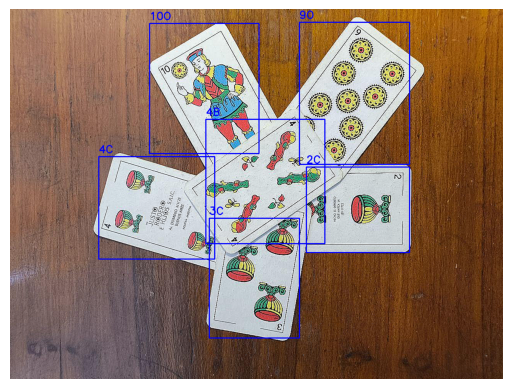

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_33.png
26.0 [0.263963, 0.663836, 0.287566, 0.314389]
7.0 [0.484209, 0.499446, 0.285904, 0.353134]
35.0 [0.730219, 0.635054, 0.250997, 0.383023]
43.0 [0.503324, 0.795016, 0.249335, 0.366418]
12.0 [0.531582, 0.247603, 0.214428, 0.383023]
28.0 [0.700715, 0.235426, 0.16373, 0.354241]
25.0 [0.372839, 0.330075, 0.289229, 0.253504]


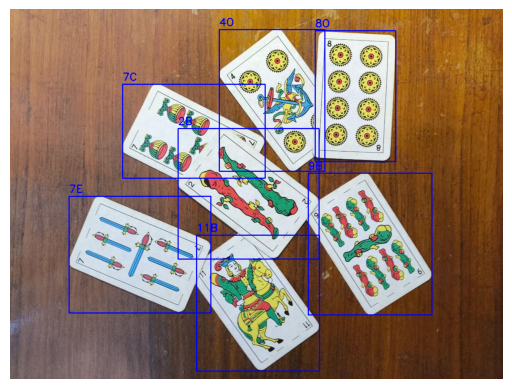

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_34.png
18.0 [0.477702, 0.405134, 0.428125, 0.283482]
30.0 [0.236881, 0.642857, 0.330013, 0.319196]
14.0 [0.439795, 0.69308, 0.230415, 0.308036]
2.0 [0.691765, 0.764509, 0.276498, 0.207589]
35.0 [0.656087, 0.631138, 0.371637, 0.110491]
35.0 [0.628586, 0.511719, 0.358258, 0.16183]


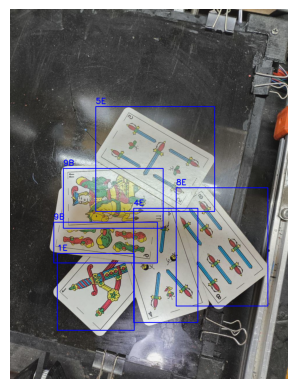

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_35.png
32.0 [0.323803, 0.13635, 0.374003, 0.266788]
36.0 [0.322141, 0.319559, 0.339096, 0.307747]
5.0 [0.279754, 0.460148, 0.375665, 0.429517]
6.0 [0.628823, 0.55369, 0.332447, 0.151659]
15.0 [0.670379, 0.725829, 0.28258, 0.272323]
39.0 [0.587683, 0.792802, 0.356549, 0.410698]


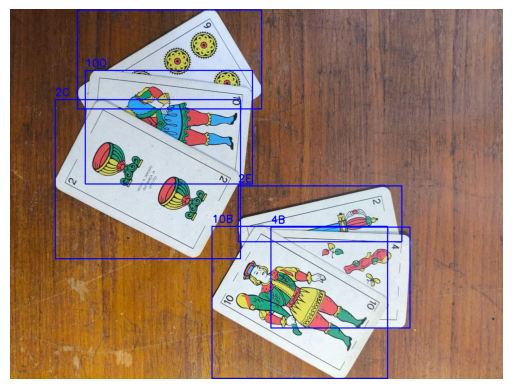

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_37.png
2.0 [0.228705, 0.460379, 0.24528, 0.25558]
6.0 [0.482161, 0.362165, 0.234874, 0.208705]
39.0 [0.539393, 0.507812, 0.16798, 0.261161]
37.0 [0.760146, 0.467634, 0.237847, 0.245536]
18.0 [0.643452, 0.709821, 0.337446, 0.236607]
35.0 [0.385536, 0.792969, 0.324067, 0.311384]
43.0 [0.312695, 0.592634, 0.231901, 0.254464]


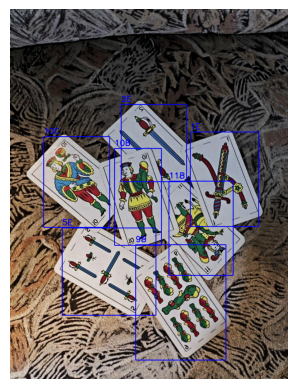

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_38.png
43.0 [0.155502, 0.295758, 0.190326, 0.408484]
35.0 [0.384475, 0.297418, 0.18617, 0.409591]
25.0 [0.610954, 0.300739, 0.196975, 0.398521]
42.0 [0.809176, 0.298525, 0.176197, 0.402949]
14.0 [0.192071, 0.761253, 0.19365, 0.402949]
2.0 [0.415226, 0.759592, 0.20113, 0.408484]
28.0 [0.605552, 0.753504, 0.189495, 0.396307]
27.0 [0.813331, 0.751843, 0.182846, 0.390772]


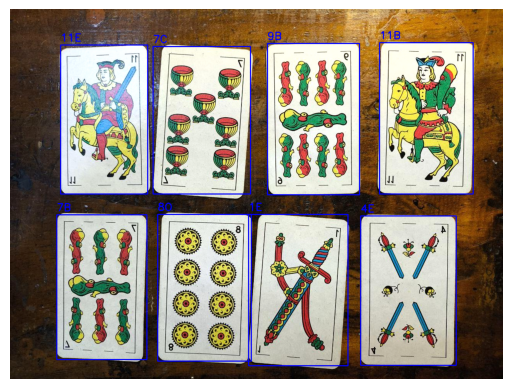

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_36.png
23.0 [0.192487, 0.284134, 0.187832, 0.394093]
17.0 [0.383644, 0.274171, 0.177859, 0.394093]
34.0 [0.568567, 0.299632, 0.17869, 0.391879]
11.0 [0.773853, 0.300186, 0.175366, 0.390772]
20.0 [0.157995, 0.726936, 0.187001, 0.409591]
46.0 [0.355386, 0.717526, 0.189495, 0.404056]
47.0 [0.562334, 0.720847, 0.202793, 0.404056]
9.0 [0.76014, 0.71974, 0.187832, 0.390772]


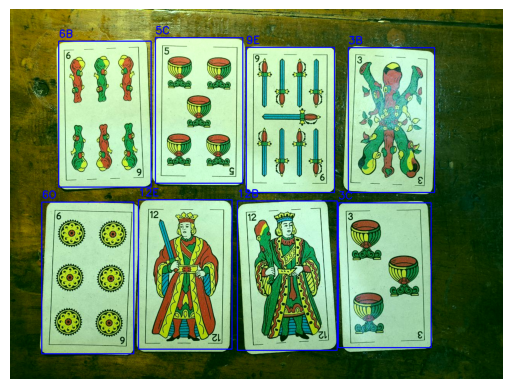

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_39.png
21.0 [0.251912, 0.34668, 0.270113, 0.308854]
37.0 [0.229056, 0.186165, 0.260971, 0.200368]
11.0 [0.328374, 0.214947, 0.226895, 0.22915]
47.0 [0.672872, 0.677674, 0.239362, 0.37306]
3.0 [0.659574, 0.802765, 0.257646, 0.282286]
20.0 [0.536569, 0.74188, 0.179521, 0.326566]


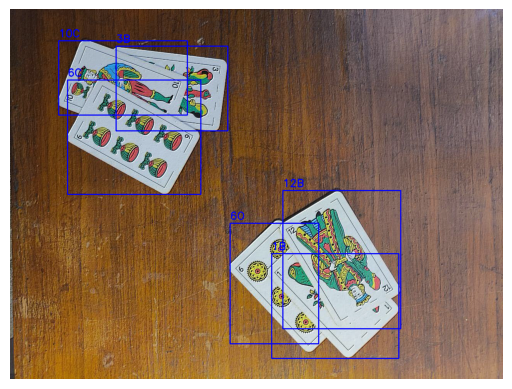

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_03.png
18.0 [0.242827, 0.511161, 0.237847, 0.276786]
30.0 [0.446484, 0.675223, 0.220009, 0.270089]
45.0 [0.384793, 0.38058, 0.364204, 0.319196]
1.0 [0.58622, 0.481027, 0.214063, 0.287946]
16.0 [0.737104, 0.617746, 0.355285, 0.309152]


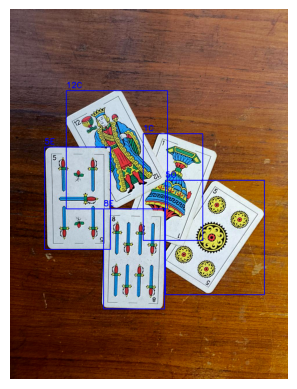

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_06.png
25.0 [0.242769, 0.478413, 0.298371, 0.304426]
7.0 [0.239029, 0.776197, 0.309176, 0.370846]
34.0 [0.405668, 0.645017, 0.22357, 0.261253]
27.0 [0.544049, 0.502768, 0.290891, 0.368632]
11.0 [0.640043, 0.732471, 0.288398, 0.256825]
28.0 [0.873446, 0.639003, 0.251546, 0.35771]
4.0 [0.813331, 0.037273, 0.091423, 0.073062]
33.0 [0.883004, 0.152409, 0.23243, 0.292265]


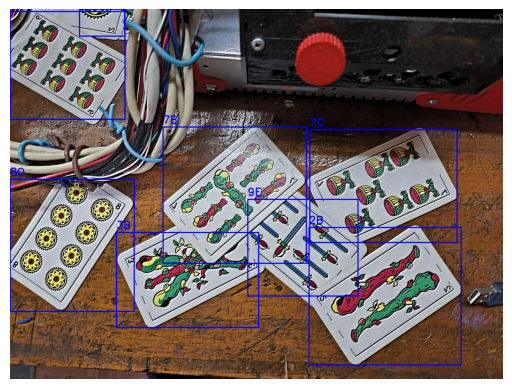

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_18.png
9.0 [0.171473, 0.509487, 0.332986, 0.242187]
5.0 [0.335737, 0.66183, 0.334473, 0.200893]
15.0 [0.350602, 0.380022, 0.200684, 0.24442]
39.0 [0.514865, 0.49721, 0.193251, 0.231027]
32.0 [0.531961, 0.207589, 0.24528, 0.247768]
6.0 [0.653114, 0.381138, 0.264605, 0.253348]
0.0 [0.855768, 0.446971, 0.286383, 0.260013]
36.0 [0.705143, 0.62779, 0.33596, 0.237723]


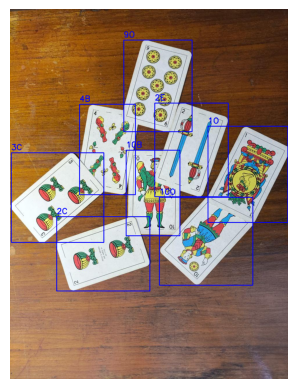

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_09.png
1.0 [0.382397, 0.199449, 0.33494, 0.293356]
45.0 [0.376164, 0.469004, 0.360705, 0.285607]
40.0 [0.267287, 0.483948, 0.274269, 0.43948]
16.0 [0.746842, 0.53321, 0.377327, 0.438373]
18.0 [0.737284, 0.693172, 0.353225, 0.27343]
30.0 [0.721077, 0.776751, 0.355718, 0.274537]


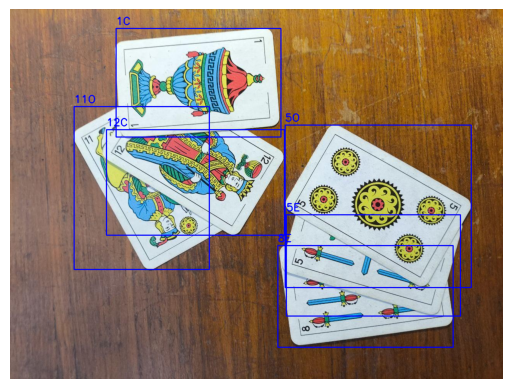

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_25.png
1.0 [0.332114, 0.190593, 0.289229, 0.302212]
26.0 [0.625914, 0.266422, 0.296709, 0.247969]
46.0 [0.807513, 0.42417, 0.315824, 0.297784]
12.0 [0.384059, 0.538192, 0.187001, 0.392986]
29.0 [0.259392, 0.766788, 0.308344, 0.292249]
0.0 [0.560672, 0.749629, 0.259309, 0.269002]
16.0 [0.743517, 0.749629, 0.329122, 0.33985]
45.0 [0.623836, 0.535978, 0.292553, 0.264574]


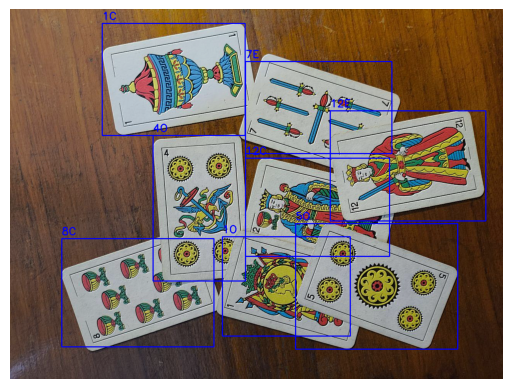

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_13.png
21.0 [0.198305, 0.441329, 0.197806, 0.409591]
47.0 [0.382812, 0.330629, 0.299202, 0.418447]
20.0 [0.603474, 0.275278, 0.31998, 0.438373]
24.0 [0.5, 0.54262, 0.315824, 0.282286]
22.0 [0.365359, 0.726936, 0.264295, 0.425089]
3.0 [0.610954, 0.804426, 0.333278, 0.378595]
8.0 [0.768866, 0.599077, 0.301695, 0.25129]


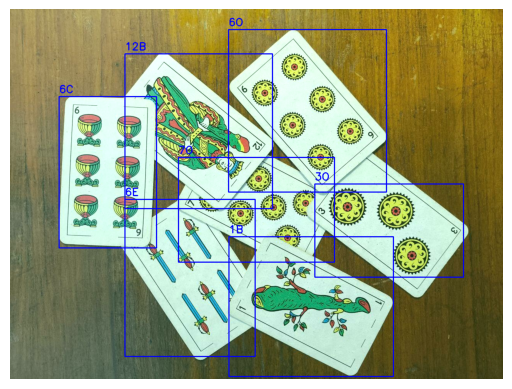

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_14.png
1.0 [0.195258, 0.461496, 0.139735, 0.16183]
3.0 [0.272558, 0.553013, 0.196224, 0.233259]
30.0 [0.590679, 0.636161, 0.217036, 0.198661]
45.0 [0.675413, 0.558036, 0.190278, 0.212054]
12.0 [0.817378, 0.521205, 0.251226, 0.214286]
26.0 [0.382563, 0.332589, 0.190278, 0.120536]
29.0 [0.425673, 0.299107, 0.166493, 0.154018]
10.0 [0.555002, 0.253348, 0.228928, 0.176339]


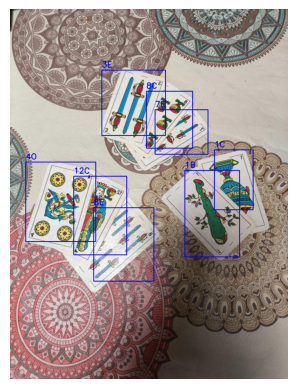

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_26.png
31.0 [0.212353, 0.5, 0.224469, 0.290179]
4.0 [0.398915, 0.446429, 0.321094, 0.276786]
46.0 [0.641965, 0.280134, 0.379069, 0.258929]
42.0 [0.721495, 0.523996, 0.37461, 0.264509]
44.0 [0.497027, 0.661272, 0.199197, 0.24442]
19.0 [0.62041, 0.761161, 0.353798, 0.256696]


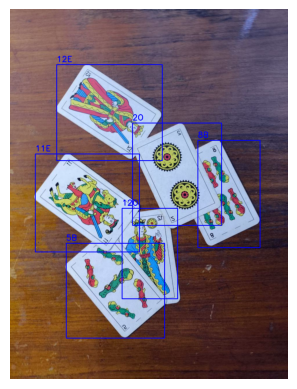

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_19.png
46.0 [0.198974, 0.226004, 0.263119, 0.235491]
47.0 [0.306006, 0.391741, 0.319608, 0.254464]
20.0 [0.45466, 0.177455, 0.313661, 0.183036]
9.0 [0.667237, 0.305804, 0.367177, 0.241071]
17.0 [0.744537, 0.547433, 0.355285, 0.172991]
34.0 [0.300803, 0.695871, 0.267578, 0.295759]
11.0 [0.546083, 0.695312, 0.261632, 0.287946]
23.0 [0.726698, 0.706473, 0.364204, 0.212054]


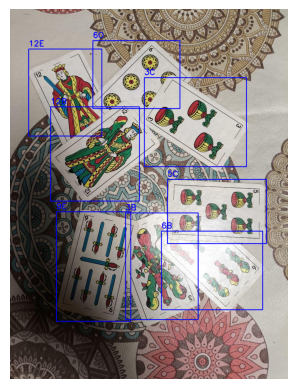

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_16.png
38.0 [0.164784, 0.299665, 0.316634, 0.300223]
22.0 [0.766092, 0.30692, 0.368664, 0.279018]
7.0 [0.465066, 0.28404, 0.230415, 0.297991]
33.0 [0.320128, 0.454799, 0.309202, 0.197545]
6.0 [0.651628, 0.446429, 0.321094, 0.220982]
4.0 [0.262896, 0.717634, 0.266092, 0.267857]
24.0 [0.447228, 0.690848, 0.212576, 0.241071]
36.0 [0.640479, 0.732701, 0.286904, 0.262277]


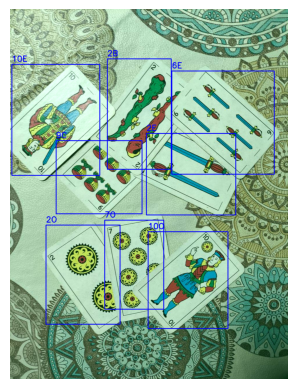

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_20.png
44.0 [0.453042, 0.354429, 0.316656, 0.441694]
19.0 [0.326712, 0.396495, 0.221908, 0.293356]
31.0 [0.401097, 0.649999, 0.320811, 0.255718]
46.0 [0.694066, 0.418082, 0.283411, 0.402949]
42.0 [0.721077, 0.564206, 0.302527, 0.250183]
4.0 [0.691157, 0.728596, 0.334109, 0.235792]


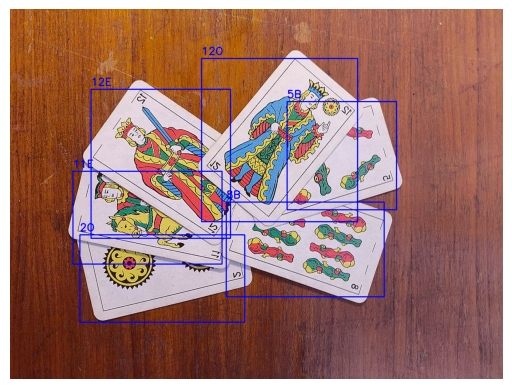

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_22.png
17.0 [0.404837, 0.371588, 0.336602, 0.409591]
10.0 [0.632563, 0.336164, 0.26014, 0.440587]
2.0 [0.667886, 0.481734, 0.108045, 0.293356]
41.0 [0.758893, 0.494465, 0.123836, 0.287821]
13.0 [0.664561, 0.729703, 0.314162, 0.368632]
29.0 [0.428108, 0.64391, 0.230219, 0.276751]


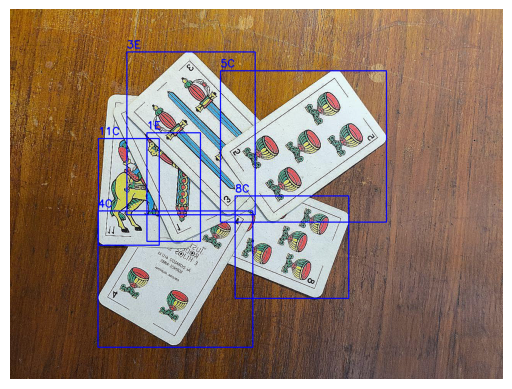

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_27.png
47.0 [0.18002, 0.498893, 0.18617, 0.378595]
3.0 [0.342088, 0.486162, 0.152926, 0.37306]
20.0 [0.465093, 0.521033, 0.129654, 0.343171]
22.0 [0.59267, 0.528229, 0.138797, 0.37306]
24.0 [0.723986, 0.492251, 0.175366, 0.354241]
8.0 [0.847822, 0.513838, 0.125499, 0.348706]


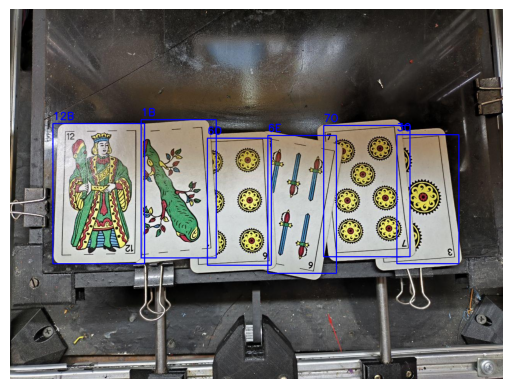

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_05.png
36.0 [0.281001, 0.319005, 0.122174, 0.2845]
13.0 [0.37367, 0.301846, 0.093085, 0.254611]
44.0 [0.436835, 0.320112, 0.162899, 0.260146]
16.0 [0.630485, 0.425831, 0.134641, 0.236899]
42.0 [0.691157, 0.501661, 0.18617, 0.266788]
21.0 [0.36993, 0.707563, 0.070645, 0.291142]
32.0 [0.422291, 0.685423, 0.100565, 0.280072]
5.0 [0.498338, 0.722508, 0.221077, 0.316603]


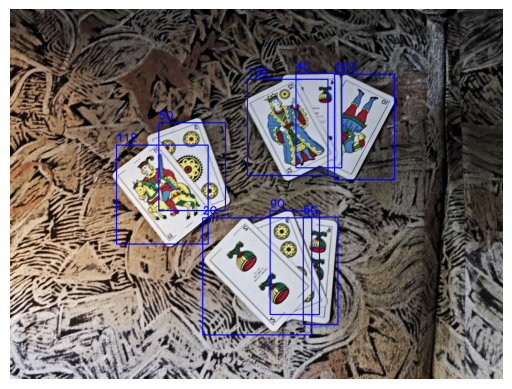

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_10.png
14.0 [0.659804, 0.323103, 0.367177, 0.195312]
38.0 [0.656087, 0.415179, 0.359744, 0.149554]
33.0 [0.669466, 0.518415, 0.282444, 0.148438]
34.0 [0.235395, 0.598772, 0.175413, 0.177455]
23.0 [0.327561, 0.623326, 0.199197, 0.172991]
27.0 [0.426416, 0.731027, 0.352312, 0.261161]


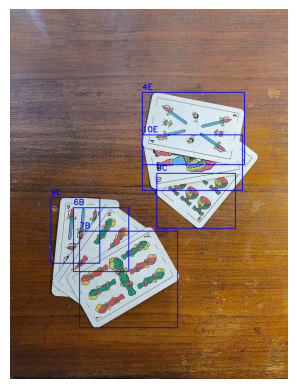

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_04.png
44.0 [0.133477, 0.52214, 0.224402, 0.427303]
13.0 [0.264378, 0.485055, 0.16373, 0.397414]
36.0 [0.378241, 0.460701, 0.177028, 0.379702]
5.0 [0.50748, 0.454059, 0.154588, 0.38413]
32.0 [0.631732, 0.408672, 0.185339, 0.412912]
9.0 [0.699884, 0.394281, 0.158743, 0.401842]
21.0 [0.850316, 0.415868, 0.195312, 0.416233]


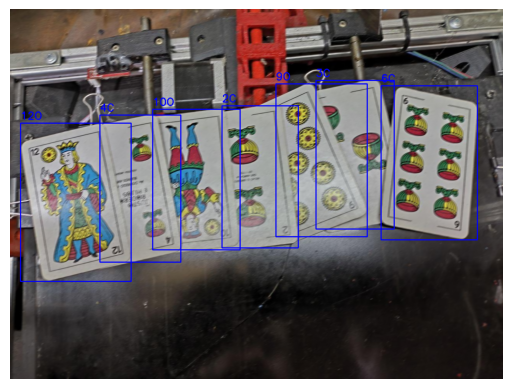

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_07.png
4.0 [0.164229, 0.283027, 0.191157, 0.400735]
33.0 [0.355386, 0.254799, 0.196144, 0.412912]
7.0 [0.580618, 0.299632, 0.219415, 0.425089]
6.0 [0.79006, 0.299632, 0.204455, 0.416233]
36.0 [0.154671, 0.723615, 0.205286, 0.418447]
22.0 [0.355386, 0.725275, 0.196144, 0.415126]
38.0 [0.52618, 0.731917, 0.216922, 0.421768]
24.0 [0.748504, 0.72915, 0.227726, 0.431731]


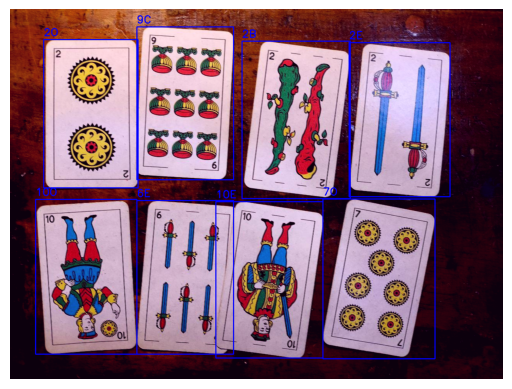

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_11.png
12.0 [0.35497, 0.209965, 0.183677, 0.296677]
26.0 [0.544465, 0.284688, 0.226895, 0.27343]
7.0 [0.425199, 0.463469, 0.229388, 0.230257]
22.0 [0.744348, 0.628412, 0.250997, 0.292249]
24.0 [0.716922, 0.793909, 0.255984, 0.255718]
8.0 [0.645445, 0.831547, 0.199468, 0.180441]


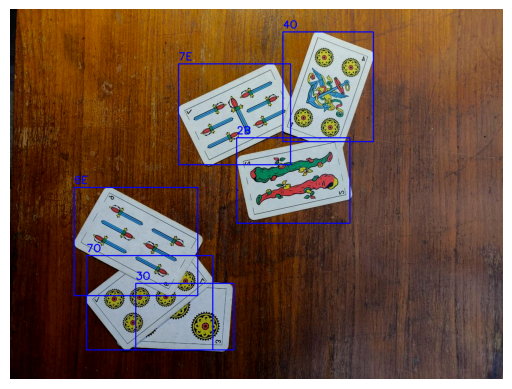

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_02.png
29.0 [0.185838, 0.265869, 0.174535, 0.392986]
1.0 [0.39985, 0.299079, 0.206948, 0.423982]
26.0 [0.602643, 0.273064, 0.190326, 0.400735]
3.0 [0.800864, 0.321773, 0.172872, 0.385237]
12.0 [0.152593, 0.702582, 0.192819, 0.407377]
10.0 [0.376579, 0.734685, 0.195312, 0.405163]
30.0 [0.606799, 0.731917, 0.205286, 0.399628]
45.0 [0.829953, 0.724168, 0.187832, 0.381916]


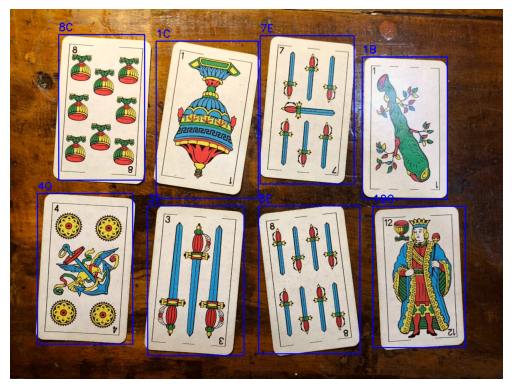

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_17.png
41.0 [0.392969, 0.325335, 0.410287, 0.331473]
10.0 [0.711833, 0.423549, 0.396908, 0.327009]
17.0 [0.435335, 0.466518, 0.352312, 0.252232]
29.0 [0.167014, 0.560268, 0.252713, 0.28125]
2.0 [0.421213, 0.723214, 0.33596, 0.310268]
40.0 [0.652371, 0.582031, 0.248253, 0.184152]
13.0 [0.809945, 0.691406, 0.325554, 0.30692]


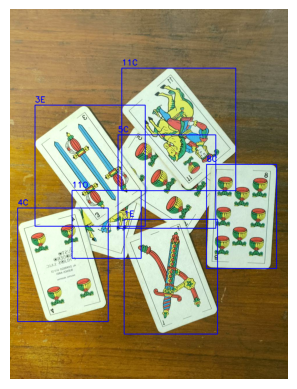

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_08.png
21.0 [0.142204, 0.252585, 0.200299, 0.412912]
44.0 [0.359541, 0.240408, 0.211104, 0.421768]
16.0 [0.582696, 0.252585, 0.20861, 0.421768]
32.0 [0.788813, 0.254799, 0.200299, 0.419554]
13.0 [0.143866, 0.716419, 0.20861, 0.419554]
40.0 [0.365775, 0.715866, 0.196975, 0.414019]
39.0 [0.568567, 0.703689, 0.198637, 0.420661]
18.0 [0.759724, 0.729703, 0.185339, 0.40627]


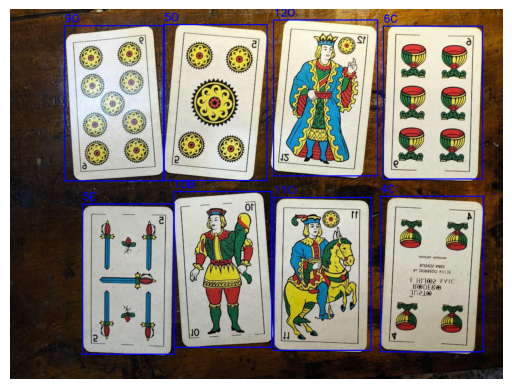

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_12.png
37.0 [0.153424, 0.249817, 0.179521, 0.376381]
8.0 [0.338763, 0.252031, 0.20113, 0.389665]
0.0 [0.52618, 0.252585, 0.168717, 0.381916]
31.0 [0.718168, 0.274171, 0.173703, 0.376381]
19.0 [0.1688, 0.659962, 0.183677, 0.388558]
15.0 [0.371177, 0.681548, 0.172872, 0.378595]
5.0 [0.547374, 0.689297, 0.182846, 0.374167]
41.0 [0.755984, 0.689851, 0.192819, 0.386344]


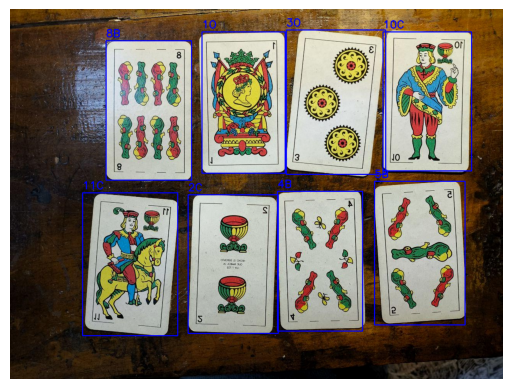

/content/drive/MyDrive/dataset/train/images2/S57061_Leandro_Salvañá_23.png
35.0 [0.252743, 0.40203, 0.210273, 0.264574]
14.0 [0.519947, 0.264762, 0.277593, 0.266788]
18.0 [0.409408, 0.491697, 0.17121, 0.370846]
6.0 [0.590176, 0.590774, 0.29006, 0.245755]
43.0 [0.787982, 0.65498, 0.285073, 0.239113]
37.0 [0.483793, 0.798891, 0.291722, 0.312175]


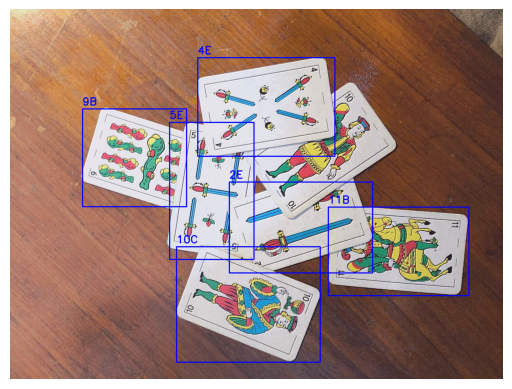

In [ ]:
# Procesar cada imagen y su correspondiente etiqueta
for image_filename in os.listdir(images_dir):
    # Leer la imagen
    image_path = os.path.join(images_dir, image_filename)
    print(image_path)
    image = cv2.imread(image_path)
    height, width, _ = image.shape

    # Leer la etiqueta correspondiente
    label_filename = image_filename.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt')
    label_path = os.path.join(labels_dir, label_filename)
    bboxes = []
    category_ids = []

    with open(label_path, 'r') as f:
        for line in f.readlines():
            class_id, center_x, center_y, w, h = map(float, line.strip().split())
            bbox = [center_x, center_y, w, h]
            print(class_id, bbox)
            bboxes.append(bbox)
            category_ids.append(int(class_id))

    # Aplicar la transformación
    transformed = transform(image=image, bboxes=bboxes, category_ids=category_ids)

    # Convertir las bounding boxes transformadas a píxeles para la visualización
    transformed_bboxes = []
    for bbox in transformed['bboxes']:
        center_x, center_y, w, h = bbox
        x_min = (center_x - w / 2) * width
        y_min = (center_y - h / 2) * height
        transformed_bbox = [x_min, y_min, w * width, h * height]
        transformed_bboxes.append(transformed_bbox)

    # Guardar la imagen transformada
    transformed_image_path = os.path.join(images_dir, f'aug_{image_filename}')
    cv2.imwrite(transformed_image_path, transformed['image'])

    # Guardar las nuevas etiquetas en formato YOLO
    transformed_label_path = os.path.join(labels_dir, f'aug_{label_filename}')
    with open(transformed_label_path, 'w') as f:
        for bbox, category_id in zip(transformed['bboxes'], transformed['category_ids']):
            center_x, center_y, w, h = bbox
            f.write(f"{category_id} {center_x} {center_y} {w} {h}\n")

    # Visualizar la imagen transformada
    visualize(transformed['image'], transformed_bboxes, transformed['category_ids'], category_id_to_name)


En la celda anterior aumenté unas imágenes que separé en una nueva carpeta de prueba y las grafiqué junto con su bounding box para ver si seguían teniendo coherencia, fuí realizando múltiples iteraciones, probando distintas aumentaciones.

Ahora si aumentamos todo nuestro dataset de entrenamiento, esto duplicará la cantidad de imagenes.

In [ ]:
# Directorios de las imágenes y etiquetas
images_dir = '/content/drive/MyDrive/dataset/train/images'
labels_dir = '/content/drive/MyDrive/dataset/train/labels'

# Procesar cada imagen y su correspondiente etiqueta
for image_filename in os.listdir(images_dir):
    # Leer la imagen
    image_path = os.path.join(images_dir, image_filename)
    path = os.path.join(images_dir, f'aug_{image_filename}')
    image = cv.imread(image_path)
    if image is None:
      continue
    height, width, _ = image.shape

    # Leer la etiqueta correspondiente
    label_filename = image_filename.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt')
    label_path = os.path.join(labels_dir, label_filename)
    bboxes = []
    category_ids = []

    with open(label_path, 'r') as f:
      try:
        for line in f.readlines():
            class_id, center_x, center_y, w, h = map(float, line.strip().split())
            bbox = [center_x, center_y, w, h]
            bboxes.append(bbox)
            category_ids.append(int(class_id))
      except:
        continue

    try:
      # Aplicar la transformación
      transformed = transform(image=image, bboxes=bboxes, category_ids=category_ids)
    except:
      continue

    # Guardar la imagen transformada
    transformed_image_path = os.path.join(images_dir, f'aug_{image_filename}')
    cv.imwrite(transformed_image_path, transformed['image'])

    # Guardar las nuevas etiquetas en formato YOLO
    transformed_label_path = os.path.join(labels_dir, f'aug_{label_filename}')
    with open(transformed_label_path, 'w') as f:
        for bbox, category_id in zip(transformed['bboxes'], transformed['category_ids']):
            center_x, center_y, w, h = bbox
            f.write(f"{category_id} {center_x} {center_y} {w} {h}\n")


In [ ]:
txtsval = get_files_from_folder('/content/drive/MyDrive/dataset/test/labels')
imgsval = get_files_from_folder('/content/drive/MyDrive/dataset/test/images')

txtstrain = get_files_from_folder('/content/drive/MyDrive/dataset/train/labels')
imgstrain = get_files_from_folder('/content/drive/MyDrive/dataset/train/images')

len(txtsval), len(imgsval), len(txtstrain), len(txtstrain)

(498, 498, 2637, 2637)

Despues de la aumentacion obtenemos 2638 imagenes en nuestro conjunto de entrenamiento, por lo tanto 1319 se han duplicado, y esto quiere decir que hay 16 imagenes que han tenido problemas con la aumentacion ya que antes teniamos 1335

# Entrenamiento de YoloV8

In [3]:
%%capture
!pip install ultralytics --upgrade

Preparamos el archivo de configuración para el entrenamiento.
Ultralytics necesita que suministremos un archivo de configuración en formato YAML (.yml) con la información sobre nuestro dataset y sus divisiones (split)

In [4]:
classes = [
    "1O", "1C", "1E", "1B",
    "2O", "2C", "2E", "2B",
    "3O", "3C", "3E", "3B",
    "4O", "4C", "4E", "4B",
    "5O", "5C", "5E", "5B",
    "6O", "6C", "6E", "6B",
    "7O", "7C", "7E", "7B",
    "8O", "8C", "8E", "8B",
    "9O", "9C", "9E", "9B",
    "10O", "10C", "10E", "10B",
    "11O", "11C", "11E", "11B",
    "12O", "12C", "12E", "12B",
    "J", "SKIP", "SSKIP", "SSSKIP"
]

In [ ]:
len(classes)

52

In [5]:
train_config = \
f"""
# Train/val/test dataset configuration
train: /content/drive/MyDrive/dataset/train
val: /content/drive/MyDrive/dataset/test

# Number of classes
nc: {len(classes)}

# Class names
names: {classes}
"""

# Save yaml
with open('/content/train_config.yml', 'w') as f:
    f.write(train_config)

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolov8n.pt")


os.environ['TORCH_USE_CUDA_DSA'] = "1"
# Use the model
model.train(data="/content/train_config.yml", epochs=50, imgsz=512, batch=64)  # train the model
metrics = model.val()
path = model.export(format="onnx")

Ultralytics YOLOv8.2.74 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/train_config.yml, epochs=50, time=None, patience=100, batch=64, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show

train: Scanning /content/drive/MyDrive/dataset/train/labels... 2631 images, 2 backgrounds, 28 corrupt: 100%|██████████| 2637/2637 [09:11<00:00,  4.78it/s]

train: WARNING ⚠️ /content/drive/MyDrive/dataset/train/images/03531_mirian_yañez_24.jpeg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/dataset/train/images/03531_mirian_yañez_24.jpeg'
train: WARNING ⚠️ /content/drive/MyDrive/dataset/train/images/03531_mirian_yañez_25.jpeg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/dataset/train/images/03531_mirian_yañez_25.jpeg'
train: WARNING ⚠️ /content/drive/MyDrive/dataset/train/images/03531_mirian_yañez_26.jpeg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/dataset/train/images/03531_mirian_yañez_26.jpeg'
train: WARNING ⚠️ /content/drive/MyDrive/dataset/train/images/03531_mirian_yañez_27.jpeg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/dataset/train/images/03531_mirian_yañez_27.jpeg'
train: WARNING ⚠️ /content/drive/MyDrive/dataset/train/images/03531_mirian_yañez_28.jpeg: ignoring corrupt imag

train: New cache created: /content/drive/MyDrive/dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/dataset/test/labels.cache... 497 images, 1 backgrounds, 9 corrupt: 100%|██████████| 498/498 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/MyDrive/dataset/test/images/03531_mirian_yañez_29.jpeg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/dataset/test/images/03531_mirian_yañez_29.jpeg'
val: WARNING ⚠️ /content/drive/MyDrive/dataset/test/images/L32531_santiago_loza_18.jpg: ignoring corrupt image/label: negative label values [   -0.18678    -0.16988]
val: WARNING ⚠️ /content/drive/MyDrive/dataset/test/images/L32531_santiago_loza_23.jpg: ignoring corrupt image/label: negative label values [   -0.15883   -0.036542]
val: WARNING ⚠️ /content/drive/MyDrive/dataset/test/images/L32531_santiago_loza_25.jpg: ignoring corrupt image/label: negative label values [   -0.26338    -0.21159]
val: WARNING ⚠️ /content/drive/MyDrive/dataset/test/images/L32531_santiago_loza_41.jpg: ignoring corrupt image/label: negative label values [   -0.17241     -0.1403]
val: WARNING ⚠️ /content/drive/MyDrive/dataset/test/images/L32531_santiago_loza_42.jpg: ignoring corrupt image/label: 

Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 8 dataloader workers
Logging results to runs/detect/train3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      5.98G      1.365      4.831      1.356        588        512: 100%|██████████| 41/41 [09:04<00:00, 13.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.66it/s]

                   all        489       2934          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      5.88G      1.275      4.255      1.233        584        512: 100%|██████████| 41/41 [06:18<00:00,  9.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.99it/s]

                   all        489       2934     0.0215      0.461     0.0231     0.0175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      5.85G      1.301      3.732      1.279        604        512: 100%|██████████| 41/41 [05:52<00:00,  8.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]

                   all        489       2934      0.125      0.166     0.0569     0.0399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      5.93G      1.304      3.261      1.313        657        512: 100%|██████████| 41/41 [05:54<00:00,  8.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.87it/s]

                   all        489       2934      0.167      0.255      0.114     0.0802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      5.86G       1.27       2.94      1.302        477        512: 100%|██████████| 41/41 [05:26<00:00,  7.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all        489       2934       0.23      0.313      0.197      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      5.88G      1.243      2.725      1.287        636        512: 100%|██████████| 41/41 [05:32<00:00,  8.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.83it/s]

                   all        489       2934      0.283      0.354      0.264      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       5.9G      1.193      2.547      1.258        577        512: 100%|██████████| 41/41 [05:46<00:00,  8.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        489       2934      0.337      0.415      0.328      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      5.97G      1.176      2.427      1.239        540        512: 100%|██████████| 41/41 [05:40<00:00,  8.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.88it/s]

                   all        489       2934      0.379      0.438      0.378       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      5.89G      1.158      2.314      1.228        584        512: 100%|██████████| 41/41 [06:10<00:00,  9.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.81it/s]

                   all        489       2934      0.427      0.457      0.425      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      5.89G      1.147      2.229      1.217        602        512: 100%|██████████| 41/41 [05:38<00:00,  8.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        489       2934      0.516      0.485      0.486      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      5.89G      1.127      2.132      1.197        579        512: 100%|██████████| 41/41 [05:24<00:00,  7.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.83it/s]

                   all        489       2934      0.533      0.519      0.521      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      5.87G       1.09      2.062       1.18        618        512: 100%|██████████| 41/41 [05:27<00:00,  7.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.81it/s]

                   all        489       2934      0.532      0.519      0.536      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      5.89G      1.092          2      1.175        617        512: 100%|██████████| 41/41 [05:34<00:00,  8.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.84it/s]

                   all        489       2934      0.611       0.53      0.563       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50       5.9G      1.087      1.952       1.17        624        512: 100%|██████████| 41/41 [05:23<00:00,  7.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.81it/s]

                   all        489       2934      0.678      0.558      0.614      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      5.93G      1.065        1.9      1.155        631        512: 100%|██████████| 41/41 [05:22<00:00,  7.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]

                   all        489       2934      0.637      0.568      0.619      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      5.96G      1.056      1.848      1.154        549        512: 100%|██████████| 41/41 [05:28<00:00,  8.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.85it/s]

                   all        489       2934      0.666      0.587      0.632      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      5.87G      1.045      1.805      1.148        595        512: 100%|██████████| 41/41 [05:52<00:00,  8.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        489       2934       0.68      0.587      0.647       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      5.92G      1.029      1.764      1.137        609        512: 100%|██████████| 41/41 [05:34<00:00,  8.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        489       2934      0.707      0.609      0.675       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      5.93G      1.032      1.759      1.147        744        512:  15%|█▍        | 6/41 [00:01<00:09,  3.79it/s]

Descargué el archivo `last (8).pt` en la época 15

In [ ]:
# Ruta de la carpeta que deseas descargar
folder_path = '/content/runs/detect/train/'

# Nombre del archivo ZIP que se creará
zip_file_name = 'models_train.zip'

# Comprimir la carpeta
shutil.make_archive(zip_file_name.replace('.zip', ''), 'zip', folder_path)

from google.colab import files

files.download('models_train.zip')

# Continuación del entrenamiento del modelo anterior



In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [ ]:
!yolo task=detect mode=train resume=True pretrained=/content/'last (8).pt' model=yolov8n.yaml data=/content/train_config.yml epochs=5 batch=64 imgsz=512

Transferred 319/355 items from pretrained weights
Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/train_config.yml, epochs=5, time=None, patience=100, batch=64, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=/content/last (8).pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=None, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_con

Descargué el archivo `last (10).pt` en la época 4

# Validamos utilizando el parametro agnostic_nms

In [10]:
from ultralytics import YOLO
model = YOLO("/content/last (10).pt")
metrics = model.val(data='/content/train_config.yml', agnostic_nms=True)  # Ajusta la ruta a tu archivo YAML

Ultralytics YOLOv8.2.78 🚀 Python-3.10.12 torch-2.3.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3,015,788 parameters, 0 gradients, 8.1 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 14.6MB/s]
val: Scanning /content/drive/MyDrive/dataset/test/labels.cache... 497 images, 1 backgrounds, 9 corrupt: 100%|██████████| 498/498 [00:00<?, ?it/s]

val: WARNING ⚠️ /content/drive/MyDrive/dataset/test/images/03531_mirian_yañez_29.jpeg: ignoring corrupt image/label: cannot identify image file '/content/drive/MyDrive/dataset/test/images/03531_mirian_yañez_29.jpeg'
val: WARNING ⚠️ /content/drive/MyDrive/dataset/test/images/L32531_santiago_loza_18.jpg: ignoring corrupt image/label: negative label values [   -0.18678    -0.16988]
val: WARNING ⚠️ /content/drive/MyDrive/dataset/test/images/L32531_santiago_loza_23.jpg: ignoring corrupt image/label: negative label values [   -0.15883   -0.036542]
val: WARNING ⚠️ /content/drive/MyDrive/dataset/test/images/L32531_santiago_loza_25.jpg: ignoring corrupt image/label: negative label values [   -0.26338    -0.21159]
val: WARNING ⚠️ /content/drive/MyDrive/dataset/test/images/L32531_santiago_loza_41.jpg: ignoring corrupt image/label: negative label values [   -0.17241     -0.1403]
val: WARNING ⚠️ /content/drive/MyDrive/dataset/test/images/L32531_santiago_loza_42.jpg: ignoring corrupt image/label: 


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [03:16<00:00,  6.34s/it]


                   all        489       2934       0.66      0.528      0.553      0.428
                    1O         58         58      0.805      0.713      0.761      0.578
                    1C         68         69      0.574      0.652      0.644      0.475
                    1E         76         76      0.943      0.648      0.784      0.645
                    1B         66         66      0.782      0.667      0.703      0.546
                    2O         58         58      0.732      0.655      0.703      0.536
                    2C         67         68      0.721      0.676      0.679      0.516
                    2E         76         76      0.891      0.751      0.829      0.642
                    2B         66         66      0.879      0.667      0.734      0.551
                    3O         64         64      0.708      0.672      0.723      0.556
                    3C         59         59       0.59      0.525        0.5      0.389
                    3

In [11]:
import shutil
# Ruta de la carpeta que deseas descargar
folder_path = '/content/runs/detect/val'

# Nombre del archivo ZIP que se creará
zip_file_name = 'model2_detect_agnostic_nms.zip'

# Comprimir la carpeta
shutil.make_archive(zip_file_name.replace('.zip', ''), 'zip', folder_path)

from google.colab import files

files.download('model2_detect_agnostic_nms.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Evaluación y Métricas

In [ ]:
from ultralytics import YOLO
model = YOLO('/content/last (10).pt')

In [ ]:
metrics = model.val(data='/content/train_config.yml')  # Ajusta la ruta a tu archivo YAML

In [ ]:
import pandas as pd

f1score = metrics.box.f1
accuracy = metrics.box.p
recall = metrics.box.r
map50 = metrics.box.map50
map5095 = metrics.box.map75

print('f1-score: ', np.mean(f1score))
print('accuracy: ', np.mean(accuracy))
print('recall: ', np.mean(recall))
print('mAP50: ', np.mean(map50))
print('mAP[0.5:0.95]: ', np.mean(map5095))


f1-score:  0.5578646853960507
accuracy:  0.6232543190069006
recall:  0.5470960986636393
mAP50:  0.57313563560596
mAP[0.5:0.95]:  0.5001250630971695


# Métricas durante el entrenamiento

Recolecto la informacion de las metricas a travez de las epocas, del log de entrenamiento para crear los graficos que muestren como estas se desmpenian, en el entrenamiento se crea una imagen que muestra todos estos graficos y los de la funcion de perdida, tanto de entrenamiento como de test, lo que sirve para ver si el modelo overfitea, pero como no guarde esta imagen no puedo verla.

In [ ]:
import pandas as pd

# Crear el dataframe con los datos proporcionados
data = {
    "Class": ["all"] * 15,
    "Images": [489] * 15,
    "Instances": [2934] * 15,
    "Precision": [0, 0.0215, 0.125, 0.167, 0.23, 0.283, 0.337, 0.379, 0.427, 0.516, 0.533, 0.532, 0.611, 0.678, 0.637],
    "Recall": [0, 0.461, 0.166, 0.255, 0.313, 0.354, 0.415, 0.438, 0.457, 0.485, 0.519, 0.519, 0.53, 0.558, 0.568],
    "mAP50": [0, 0.0231, 0.0569, 0.114, 0.197, 0.264, 0.328, 0.378, 0.425, 0.486, 0.521, 0.536, 0.563, 0.614, 0.619],
    "mAP50-95": [0, 0.0175, 0.0399, 0.0802, 0.137, 0.187, 0.237, 0.27, 0.311, 0.358, 0.382, 0.401, 0.42, 0.455, 0.463]
}

df1 = pd.DataFrame(data)


In [ ]:
# Nuevos datos a agregar
new_data = {
    "Class": ["all"] * 5,
    "Images": [489] * 5,
    "Instances": [2934] * 5,
    "Precision": [0.02, 0.152, 0.615, 0.619, 0.642],
    "Recall": [0.000444, 0.636, 0.432, 0.547, 0.558],
    "mAP50": [0.0102, 0.387, 0.512, 0.574, 0.597],
    "mAP50-95": [0.0102, 0.307, 0.392, 0.436, 0.459]
}

# Convertir nuevos datos en un dataframe y agregar al dataframe existente
df2 = pd.DataFrame(new_data)
df = pd.concat([df1, df2], ignore_index=True)

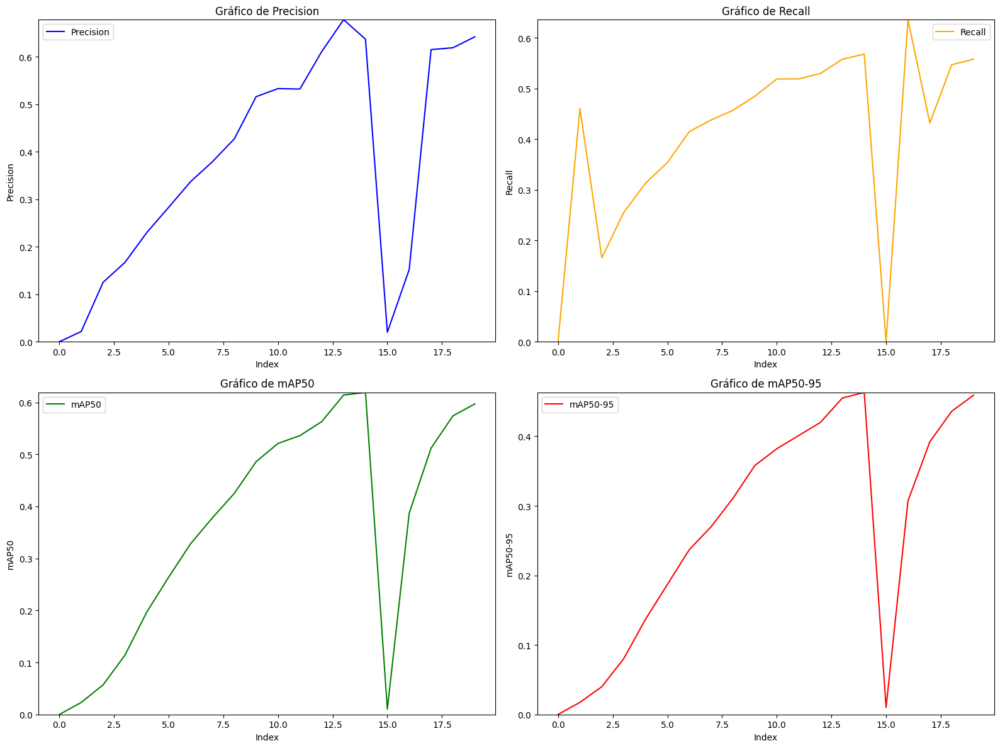

In [ ]:
import matplotlib.pyplot as plt

# Suponiendo que 'df' es el DataFrame que creaste anteriormente
epochs = range(len(df))  # Número de entradas en el DataFrame

plt.figure(figsize=(16, 12))

# Gráfico de Precision
plt.subplot(2, 2, 1)
plt.plot(epochs, df['Precision'], label='Precision', color='blue')
plt.legend()
plt.ylim([0, max(df['Precision'])])
plt.xlabel('Index')
plt.ylabel('Precision')
plt.title('Gráfico de Precision')

# Gráfico de Recall
plt.subplot(2, 2, 2)
plt.plot(epochs, df['Recall'], label='Recall', color='orange')
plt.legend()
plt.ylim([0, max(df['Recall'])])
plt.xlabel('Index')
plt.ylabel('Recall')
plt.title('Gráfico de Recall')

# Gráfico de mAP50
plt.subplot(2, 2, 3)
plt.plot(epochs, df['mAP50'], label='mAP50', color='green')
plt.legend()
plt.ylim([0, max(df['mAP50'])])
plt.xlabel('Index')
plt.ylabel('mAP50')
plt.title('Gráfico de mAP50')

# Gráfico de mAP50-95
plt.subplot(2, 2, 4)
plt.plot(epochs, df['mAP50-95'], label='mAP50-95', color='red')
plt.legend()
plt.ylim([0, max(df['mAP50-95'])])
plt.xlabel('Index')
plt.ylabel('mAP50-95')
plt.title('Gráfico de mAP50-95')

plt.tight_layout()
plt.show()


# Matriz de confusión

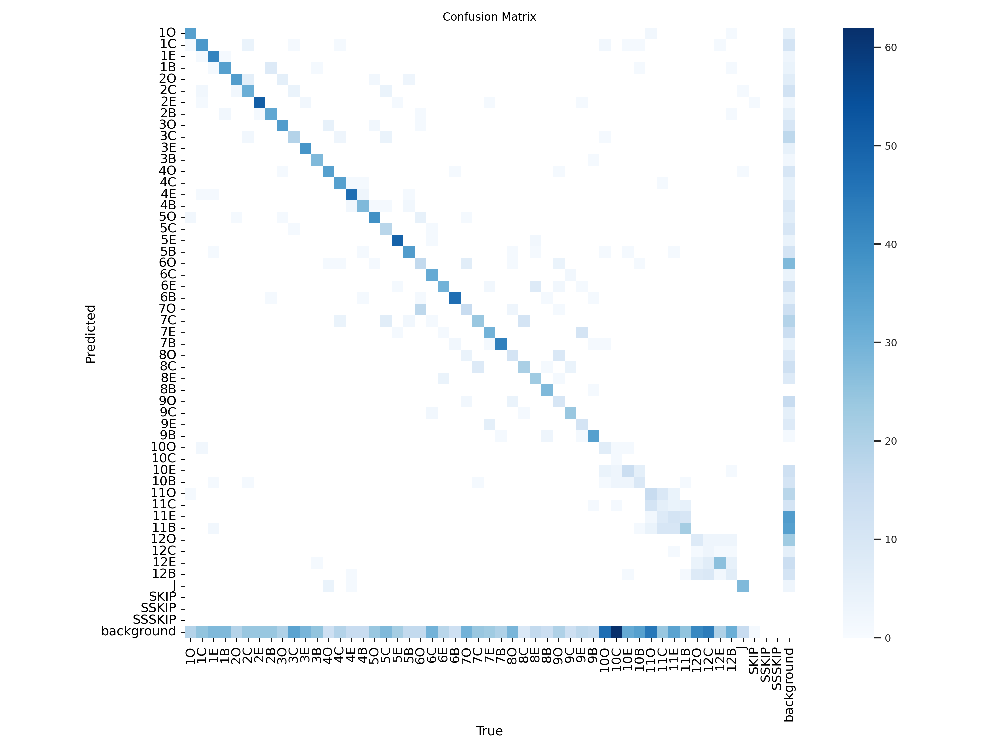

In [ ]:
train_dir = '/content/runs/detect/val'

from IPython.display import Image
Image(filename=f'{train_dir}/confusion_matrix.png', width=600)

Grafica que relaciona la presicion con el recall, lo ideal es tener la curva lo mas cercano al borde superior y borde derecho.

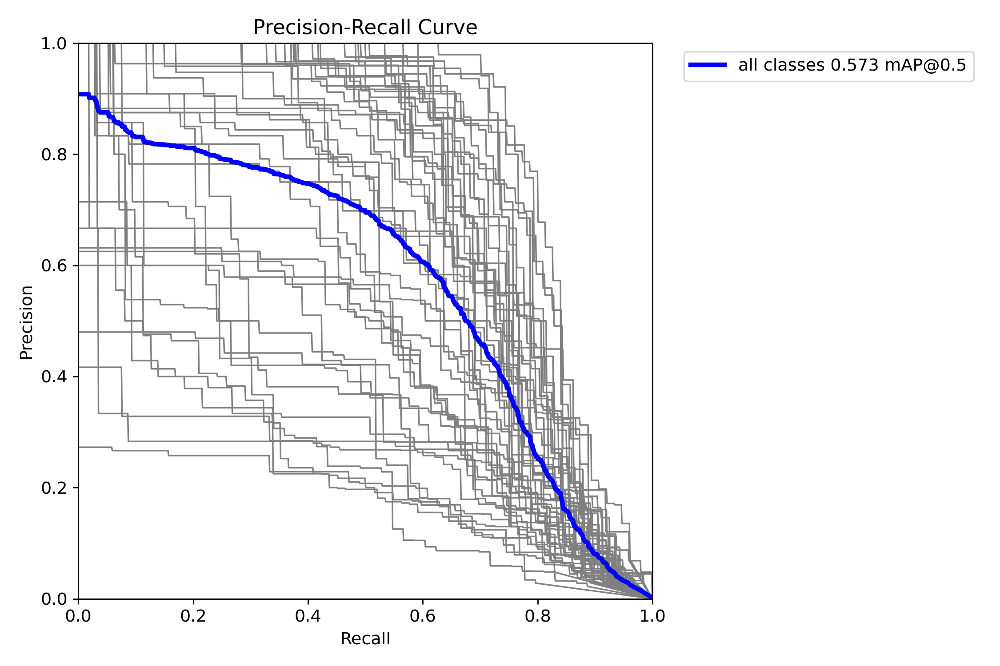

In [ ]:
from IPython.display import Image
Image(filename=f'{train_dir}/PR_curve.png', width=600)

Graficamos algunos ejemplos de detecciones, podemos ver muchas fallas, etiquetas erroneas para algunas cartas y otras que no se detectaron.

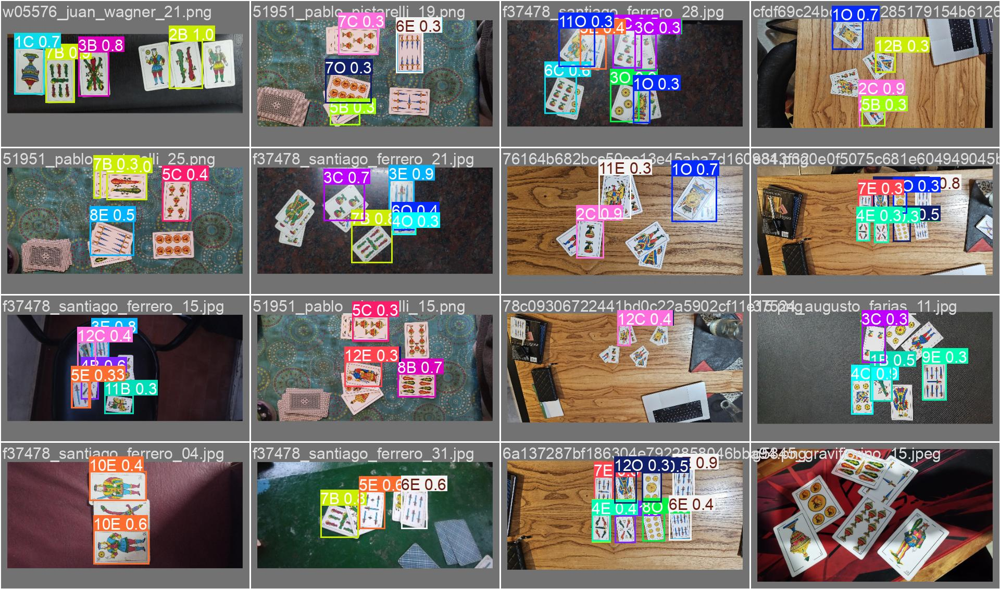

In [ ]:
from IPython.display import Image
Image(filename=f'{train_dir}/val_batch0_pred.jpg', width=600)

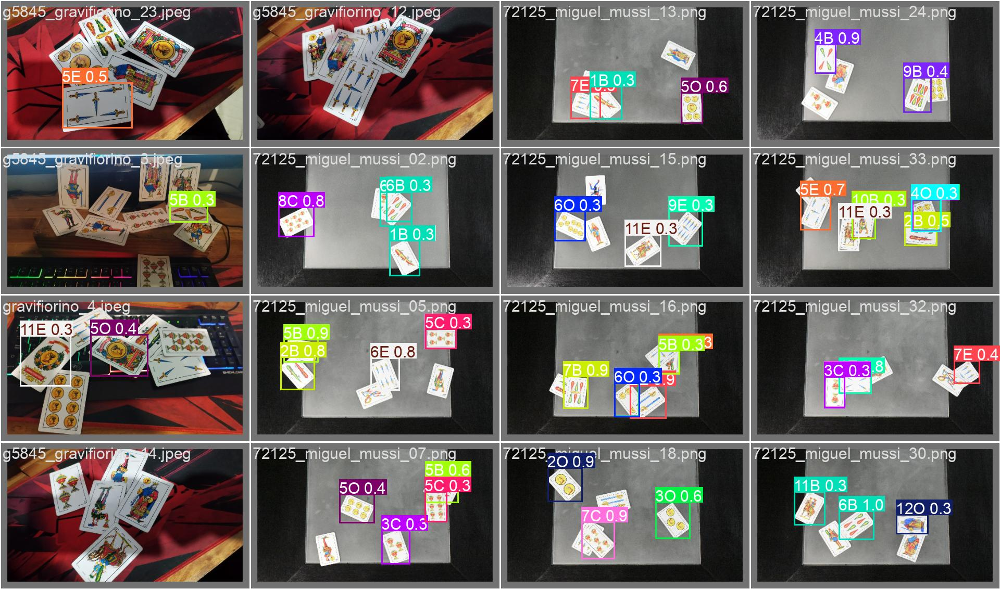

In [ ]:
from IPython.display import Image
Image(filename=f'{train_dir}/val_batch1_pred.jpg', width=600)